### **Running a series of modelling experiments on our Food Vision data**
1.  **Model 0:** A transfer learning model using the Keras Functional API

2.  **Model 1:** A feature extraction transfer learning model on 1% of the data with data augmentation

3.  **Model 2:** A feature extraction transfer learning model on 10% of the data with data augmentation

4.  **Model 3:** A fine-tuned transfer learning model on 10% of the data

5.  **Model 4:** A fine-tuned transfer learning model on 100% of the data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import datetime
import pandas as pd
import os
import random
from pathlib import Path
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
dataset_path = Path("/content/drive/MyDrive/Dataset/10_food_classes_10_percent")

train_path = dataset_path / "train"
test_path = dataset_path / "test"

In [ ]:
def display_structure(path, indent=0):
    for item in sorted(path.iterdir()):
        if item.is_dir():
            print(' ' * indent + '└───' + item.name)
            display_structure(item, indent + 4)

print("Dataset Structure:")
display_structure(dataset_path)

Dataset Structure:
└───test
    └───chicken_curry
    └───chicken_wings
    └───fried_rice
    └───grilled_salmon
    └───hamburger
    └───ice_cream
    └───pizza
    └───ramen
    └───steak
    └───sushi
└───train
    └───chicken_curry
    └───chicken_wings
    └───fried_rice
    └───grilled_salmon
    └───hamburger
    └───ice_cream
    └───pizza
    └───ramen
    └───steak
    └───sushi


       ramen  pizza  steak  grilled_salmon  sushi  hamburger  ice_cream  \
Train     75     75     75              75     75         75         75   
Test     250    250    250             250    250        250        250   

       fried_rice  chicken_wings  chicken_curry  
Train          75             75             75  
Test          250            250            250  


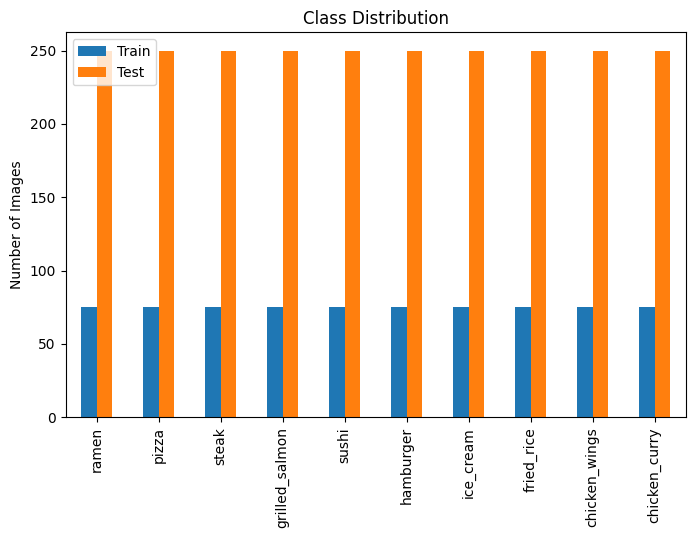

In [ ]:
def count_images_per_class(folder_path):
    counts = {}
    for subfolder in folder_path.iterdir():
        if subfolder.is_dir():
            counts[subfolder.name] = len(list(subfolder.glob("*.jpg")))
    return counts

train_counts = count_images_per_class(train_path)
test_counts = count_images_per_class(test_path)

df = pd.DataFrame([train_counts, test_counts], index=["Train", "Test"])
print(df)

df.T.plot(kind="bar", figsize=(8, 5), title="Class Distribution")
plt.ylabel("Number of Images")
plt.show()

### **Helper Functions**

In [ ]:
def create_tensorboard_callback(dir_name, experiment_name):
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = tf.keras.callbacks.TensorBoard(
      log_dir=log_dir
  )
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

def plot_loss_curves(history):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  accuracy = history.history['accuracy']
  val_accuracy = history.history['val_accuracy']

  epochs = range(len(history.history['loss']))

  # Plot loss
  plt.plot(epochs, loss, label='training_loss')
  plt.plot(epochs, val_loss, label='val_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()

  # Plot accuracy
  plt.figure()
  plt.plot(epochs, accuracy, label='training_accuracy')
  plt.plot(epochs, val_accuracy, label='val_accuracy')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend();

def compare_historys(original_history, new_history, initial_epochs=5):
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]

    print(len(acc))

    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]

    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]

    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    print(len(total_acc))
    print(total_acc)

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label='Training Accuracy')
    plt.plot(total_val_acc, label='Validation Accuracy')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(total_loss, label='Training Loss')
    plt.plot(total_val_loss, label='Validation Loss')
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning') # reshift plot around epochs
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')
    plt.show()

In [ ]:
IMG_SIZE = (224, 224)
train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_path,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode="categorical",
                                                                            batch_size=32)

test_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=test_path,
                                                                           image_size=IMG_SIZE,
                                                                           label_mode="categorical")

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


Datatype of training data: <class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>
Class Names (10 classes): ['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon', 'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi']
Batch shape: (32, 224, 224, 3), Labels: [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.

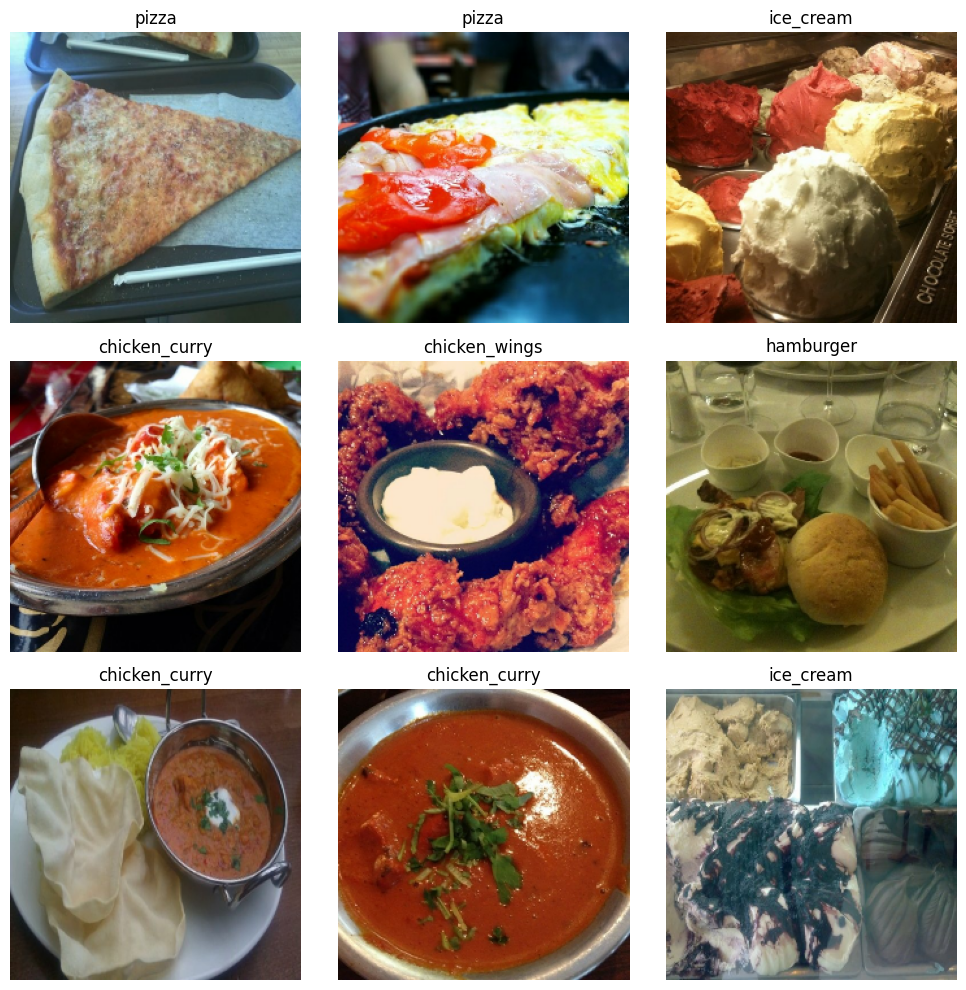

In [ ]:
print(f"Datatype of training data: {type(train_data_10_percent)}")

try:
    class_names = train_data_10_percent.class_names
    print(f"Class Names ({len(class_names)} classes): {class_names}")
except AttributeError:
    print("The dataset object does not have 'class_names' attribute.")

for images, labels in train_data_10_percent.take(1):
    print(f"Batch shape: {images.shape}, Labels: {labels}")

    class_indices = np.argmax(labels, axis=1)

    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[class_indices[i]])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

### **Model 0: Building a transfer learning model using the Keras Functional API**

In [ ]:
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)

base_model.trainable = False

inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")

x = base_model(inputs)

print(f"Shape after base_model: {x.shape}")

x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
print(f"After GlobalAveragePooling2D(): {x.shape}")

outputs = tf.keras.layers.Dense(10, activation="softmax", name="output_layer")(x)

model_0 = tf.keras.Model(inputs, outputs)

model_0.compile(loss='categorical_crossentropy',
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_10_percent = model_0.fit(train_data_10_percent,
                                 epochs=5,
                                 steps_per_epoch=len(train_data_10_percent),
                                 validation_data=test_data_10_percent,
                                 validation_steps=int(0.25 * len(test_data_10_percent)),
                                 callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_feature_extract")])

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Shape after base_model: (None, 7, 7, 1280)
After GlobalAveragePooling2D(): (None, 1280)
Saving TensorBoard log files to: transfer_learning/10_percent_feature_extract/20250205-042022
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 347s 14s/step - accuracy: 0.2753 - loss: 2.1005 - val_accuracy: 0.6859 - val_loss: 1.3448
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.7321 - loss: 1.2410 - val_accuracy: 0.7878 - val_loss: 0.9232
Epoch 3/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 440ms/step - accuracy: 0.8001 - loss: 0.9088 - val_accuracy: 0.8026 - val_loss: 0.7524
Epoch 4/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.8457 - loss: 0.7253 - val_accuracy: 0.8273 - val_loss: 0.6566
Epoch 5/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.8730 - loss: 0.6211 - val_accuracy: 0.8388 - val_loss: 0.5847


In [ ]:
model_0.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,957,744 (22.73 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 25,622 (100.09 KB)

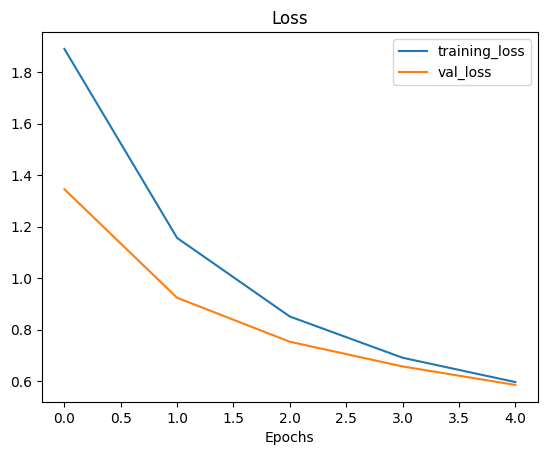

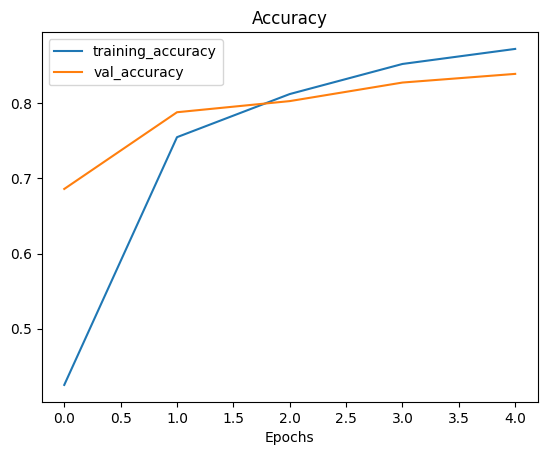

In [ ]:
plot_loss_curves(history_10_percent)

In [ ]:
dataset_path = Path("/content/drive/MyDrive/Dataset/10_food_classes_1_percent")

train_path_1_percent = dataset_path / "train"
test_path = dataset_path / "test"

       hamburger  chicken_wings  ice_cream  chicken_curry  sushi  pizza  \
Train          7              7          7              7      7      7   
Test         250            250        250            250    250    250   

       steak  grilled_salmon  ramen  fried_rice  
Train      7               7      7           7  
Test     250             250    250         250  


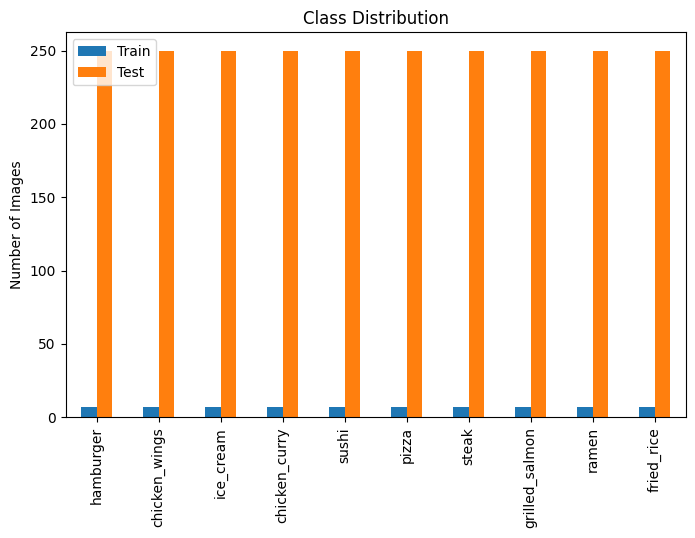

In [ ]:
train_counts = count_images_per_class(train_path_1_percent)
test_counts = count_images_per_class(test_path)

df = pd.DataFrame([train_counts, test_counts], index=["Train", "Test"])
print(df)

df.T.plot(kind="bar", figsize=(8, 5), title="Class Distribution")
plt.ylabel("Number of Images")
plt.show()

In [ ]:
IMG_SIZE = (224, 224)
train_data_1_percent = tf.keras.preprocessing.image_dataset_from_directory(train_path_1_percent,
                                                                           label_mode="categorical",
                                                                           batch_size=32,
                                                                           image_size=IMG_SIZE)
test_data = tf.keras.preprocessing.image_dataset_from_directory(test_path,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE)

Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.2),
  layers.RandomZoom(0.2),
  layers.RandomHeight(0.2),
  layers.RandomWidth(0.2),
  layers.Resizing(224, 224),
  # preprocessing.Rescaling(1./255) # keep for ResNet50V2, remove for EfficientNetV2B0
], name="data_augmentation")

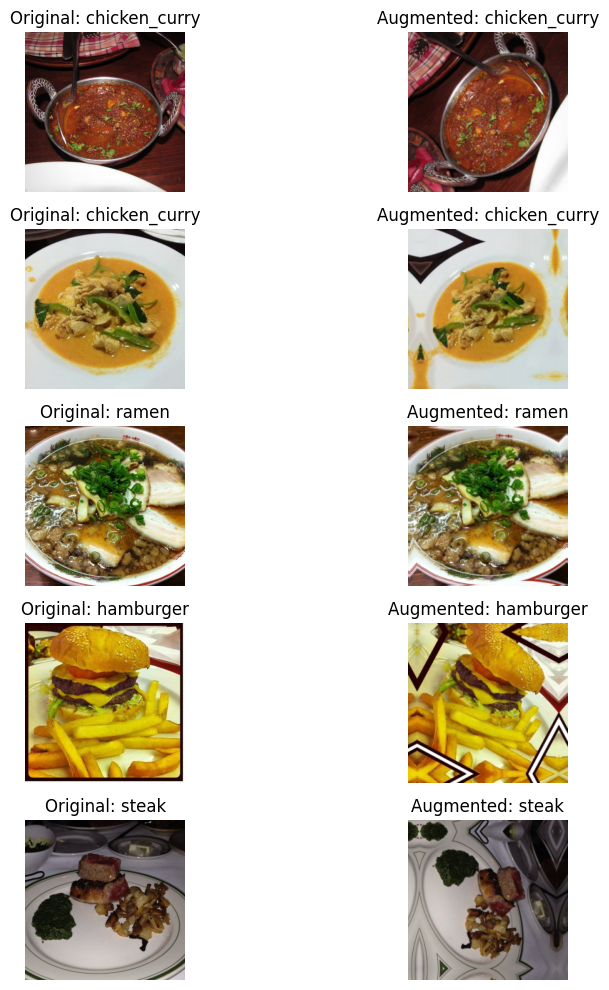

In [ ]:
num_samples = 5

plt.figure(figsize=(10, 2 * num_samples))

for i in range(num_samples):
    target_class = random.choice(os.listdir(train_path_1_percent))
    target_dir = train_path_1_percent / target_class
    random_image = random.choice(os.listdir(target_dir))
    random_image_path = os.path.join(target_dir, random_image)

    img = mpimg.imread(random_image_path)
    augmented_img = data_augmentation(tf.expand_dims(img, axis=0))

    plt.subplot(num_samples, 2, 2 * i + 1)
    plt.imshow(img)
    plt.title(f"Original: {target_class}")
    plt.axis("off")

    plt.subplot(num_samples, 2, 2 * i + 2)
    plt.imshow(tf.squeeze(augmented_img) / 255.)
    plt.title(f"Augmented: {target_class}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### **Model 1: Feature extraction transfer learning on 1% of the data with data augmentation**

In [ ]:
input_shape = (224, 224, 3)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False

inputs = layers.Input(shape=input_shape, name="input_layer")

x = data_augmentation(inputs)

x = base_model(x, training=False)

x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)

outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

model_1 = keras.Model(inputs, outputs)

model_1.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

history_1_percent = model_1.fit(train_data_1_percent,
                    epochs=5,
                    steps_per_epoch=len(train_data_1_percent),
                    validation_data=test_data,
                    validation_steps=int(0.25* len(test_data)),
                    callbacks=[create_tensorboard_callback("transfer_learning", "1_percent_data_aug")])

Saving TensorBoard log files to: transfer_learning/1_percent_data_aug/20250205-043016
Epoch 1/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 154s 68s/step - accuracy: 0.1190 - loss: 2.3924 - val_accuracy: 0.1151 - val_loss: 2.2402
Epoch 2/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 45s 22s/step - accuracy: 0.1788 - loss: 2.1724 - val_accuracy: 0.1974 - val_loss: 2.1222
Epoch 3/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 43s 3s/step - accuracy: 0.2679 - loss: 2.1202 - val_accuracy: 0.2467 - val_loss: 2.0405
Epoch 4/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.3394 - loss: 1.9172 - val_accuracy: 0.3207 - val_loss: 1.9534
Epoch 5/5
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.5000 - loss: 1.7089 - val_accuracy: 0.3898 - val_loss: 1.8689


In [ ]:
model_1.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,957,744 (22.73 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 25,622 (100.09 KB)

In [ ]:
BATCH_SIZE = 32

print("====================================================")
print("Model Evaluation - Data Augmented (1% Training Data)")
print(f"Model Name: {model_1.name}")
print(f"Test Dataset: {len(test_data)*BATCH_SIZE} samples")
print("====================================================")

print("🔄 Evaluating model performance on test data...")
results_1_percent_data_aug = model_1.evaluate(test_data, verbose=0)

print("\n✅ Evaluation Complete!")
print("\n📝 Results:\n")
print(f"Test Loss: {results_1_percent_data_aug[0]:.4f}")
print(f"Test Accuracy: {results_1_percent_data_aug[1]*100:.2f}%")
print("----------------------------------------------------")

Model Evaluation - Data Augmented (1% Training Data)
Model Name: functional_3
Test Dataset: 2528 samples
🔄 Evaluating model performance on test data...

✅ Evaluation Complete!

📝 Results:

Test Loss: 1.8902
Test Accuracy: 35.20%
----------------------------------------------------


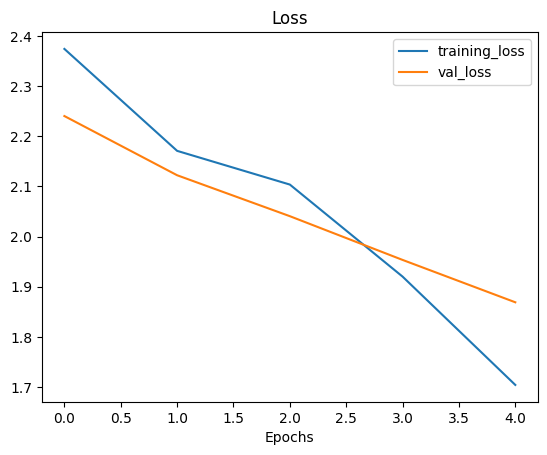

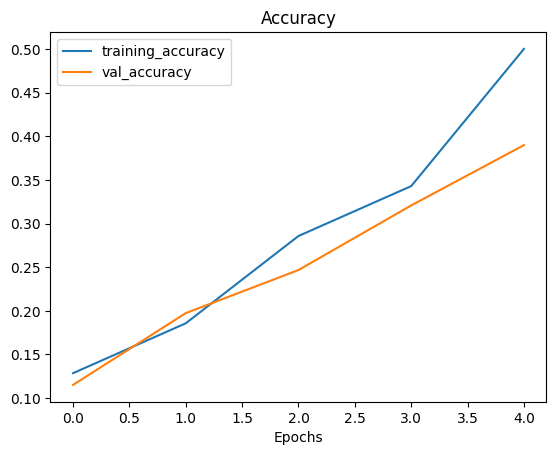

In [ ]:
plot_loss_curves(history_1_percent)

### **Model 2: Feature extraction transfer learning with 10% of data and data augmentation**

In [ ]:
dataset_path = Path("/content/drive/MyDrive/Dataset/10_food_classes_10_percent")

train_path_10_percent = dataset_path / "train"
test_path = dataset_path / "test"

In [ ]:
IMG_SIZE = (224, 224)
train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_path_10_percent,
                                                                            label_mode="categorical",
                                                                            image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_path,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE)

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
def create_base_model(input_shape: tuple[int, int, int] = (224, 224, 3),
                      output_shape: int = 10,
                      learning_rate: float = 0.001,
                      training: bool = False) -> tf.keras.Model:

    base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
    base_model.trainable = training

    inputs = layers.Input(shape=input_shape, name="input_layer")
    x = data_augmentation(inputs)
    x = base_model(x, training=False)  # pass augmented images to base model but keep it in inference mode
    x = layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    outputs = layers.Dense(units=output_shape, activation="softmax", name="output_layer")(x)
    model = tf.keras.Model(inputs, outputs)

    model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  metrics=["accuracy"])

    return model

model_2 = create_base_model()

In [ ]:
checkpoint_path = "ten_percent_model_checkpoints_weights/checkpoint.weights.h5"

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                         save_weights_only=True, # set to False to save the entire model
                                                         save_best_only=True, # save only the best model weights instead of a model every epoch
                                                         save_freq="epoch", # save every epoch
                                                         verbose=1)

In [ ]:
initial_epochs = 5
history_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                          epochs=initial_epochs,
                                          validation_data=test_data,
                                          validation_steps=int(0.25 * len(test_data)),
                                          callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_data_aug"),
                                                     checkpoint_callback])

Saving TensorBoard log files to: transfer_learning/10_percent_data_aug/20250205-044119
Epoch 1/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - accuracy: 0.1966 - loss: 2.2040
Epoch 1: val_loss improved from inf to 1.52961, saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.2008 - loss: 2.1972 - val_accuracy: 0.6201 - val_loss: 1.5296
Epoch 2/5
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.6036 - loss: 1.5190
Epoch 2: val_loss improved from 1.52961 to 1.09179, saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 34s 588ms/step - accuracy: 0.6047 - loss: 1.5158 - val_accuracy: 0.7549 - val_loss: 1.0918
Epoch 3/5
23/24 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - accuracy: 0.7117 - loss: 1.1808
Epoch 3: val_loss improved from 1.09179 to 0.87134, saving model to ten_percent_model_checkpoints_weights/checkpoint.weights.h5
24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 282ms/step - a

In [ ]:
print("====================================================")
print("Model Evaluation - Data Augmented (10% Training Data)")
print(f"Model Name: {model_2.name}")
print(f"Test Dataset: {len(test_data)*BATCH_SIZE} samples")
print("====================================================")

print("🔄 Evaluating model performance on test data...")
results_10_percent_data_aug = model_2.evaluate(test_data)

print("\n✅ Evaluation Complete!")
print("\n📝 Results:\n")
print(f"Test Loss: {results_10_percent_data_aug[0]:.4f}")
print(f"Test Accuracy: {results_10_percent_data_aug[1]*100:.2f}%")
print("----------------------------------------------------")

Model Evaluation - Data Augmented (10% Training Data)
Model Name: functional_5
Test Dataset: 2528 samples
🔄 Evaluating model performance on test data...
79/79 ━━━━━━━━━━━━━━━━━━━━ 94s 1s/step - accuracy: 0.8319 - loss: 0.6747

✅ Evaluation Complete!

📝 Results:

Test Loss: 0.6891
Test Accuracy: 82.96%
----------------------------------------------------


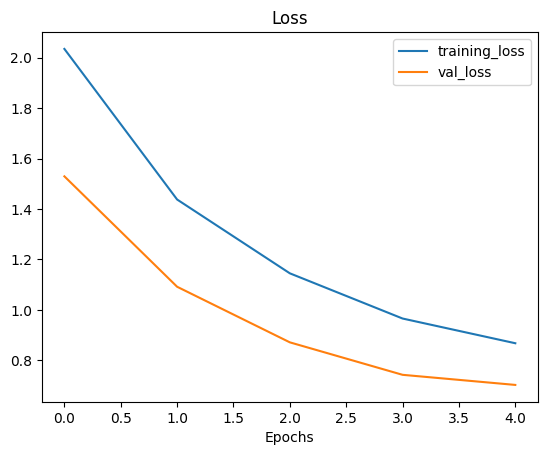

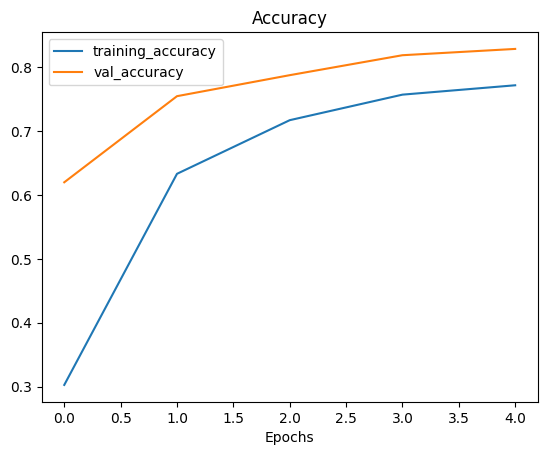

In [ ]:
plot_loss_curves(history_10_percent_data_aug)

In [ ]:
print("==========================================")
print("🔁 MODEL WEIGHTS RESTORATION")
print(f"Loading weights from: {checkpoint_path}")
print(f"Target model: {model_2.name}")
loaded_weights_model_results = model_2.load_weights(checkpoint_path)
print("✅ Weights successfully restored!")
print("==========================================")

print("\n🔍 RESULTS COMPARISON")
print("Comparing with original 10% data augmented model results:")

print("\n🔎 Strict Equality Check (==):")
print(f"Results match exactly? {results_10_percent_data_aug == loaded_weights_model_results}")
print("Note: Rarely True due to float precision limitations")

print("\n🔍 Numerical Closeness Check (np.isclose):")
close_check = np.isclose(np.array(results_10_percent_data_aug),
                        np.array(loaded_weights_model_results))
print(f"Loss values close? {close_check[0]}")
print(f"Accuracy values close? {close_check[1]}")

print("\n📉 DIFFERENCE ANALYSIS")
differences = np.array(results_10_percent_data_aug) - np.array(loaded_weights_model_results)
print(f"Loss difference: {differences[0]:.10f}")
print(f"Accuracy difference: {differences[1]*100:.10f}%")
print("\nNote: Small differences (<0.0001) are normal due to numerical precision")
print("------------------------------------------")

🔁 MODEL WEIGHTS RESTORATION
Loading weights from: ten_percent_model_checkpoints_weights/checkpoint.weights.h5
Target model: functional_5
✅ Weights successfully restored!

🔍 RESULTS COMPARISON
Comparing with original 10% data augmented model results:

🔎 Strict Equality Check (==):
Results match exactly? True
Note: Rarely True due to float precision limitations

🔍 Numerical Closeness Check (np.isclose):
Loss values close? True
Accuracy values close? True

📉 DIFFERENCE ANALYSIS
Loss difference: 0.0000000000
Accuracy difference: 0.0000000000%

Note: Small differences (<0.0001) are normal due to numerical precision
------------------------------------------


### **Model 3: Fine-tuning an existing model on 10% of the data**

In [ ]:
print("\nModel Architecture and Layer Details:")
for layer_number, layer in enumerate(model_2.layers):
    print(f"Layer {layer_number}: \n  Name: {layer.name}\n  Type: {type(layer).__name__}\n  Trainable: {'Yes' if layer.trainable else 'No'}\n")


Model Architecture and Layer Details:
Layer 0: 
  Name: input_layer
  Type: InputLayer
  Trainable: Yes

Layer 1: 
  Name: data_augmentation
  Type: Sequential
  Trainable: Yes

Layer 2: 
  Name: efficientnetv2-b0
  Type: Functional
  Trainable: No

Layer 3: 
  Name: global_average_pooling_layer
  Type: GlobalAveragePooling2D
  Trainable: Yes

Layer 4: 
  Name: output_layer
  Type: Dense
  Trainable: Yes



In [ ]:
model_2.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,957,744 (22.73 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

 Optimizer params: 25,622 (100.09 KB)

**Access the base_model layers of model_2**

In [ ]:
model_2_base_model = model_2.layers[2]
print(f"Base Model Name: {model_2_base_model.name}")

Base Model Name: efficientnetv2-b0


In [ ]:
trainable_vars = model_2_base_model.trainable_variables
print(f"Total Trainable Variables: {len(trainable_vars)}")

Total Trainable Variables: 0


In [ ]:
# Make all the layers in model_2_base_model trainable
model_2_base_model.trainable = True

# Freeze all layers except for the last 10
for layer in model_2_base_model.layers[:-10]:
  layer.trainable = False

model_2.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # lr is 10x lower than before for fine-tuning
                metrics=["accuracy"])

In [ ]:
print("Trainable Layers in the Model:\n" + "-"*35)

for layer_number, layer in enumerate(model_2_base_model.layers):
    if layer.trainable:
        print(f"Layer {layer_number}: {layer.name} (Trainable: {layer.trainable})")

print("\nTotal Trainable Variables:", len(model_2.trainable_variables))

Trainable Layers in the Model:
-----------------------------------
Layer 260: block6h_se_reduce (Trainable: True)
Layer 261: block6h_se_expand (Trainable: True)
Layer 262: block6h_se_excite (Trainable: True)
Layer 263: block6h_project_conv (Trainable: True)
Layer 264: block6h_project_bn (Trainable: True)
Layer 265: block6h_drop (Trainable: True)
Layer 266: block6h_add (Trainable: True)
Layer 267: top_conv (Trainable: True)
Layer 268: top_bn (Trainable: True)
Layer 269: top_activation (Trainable: True)

Total Trainable Variables: 12


In [ ]:
# Fine tune for another 5 epochs
fine_tune_epochs = initial_epochs + 5

history_fine_10_percent_data_aug = model_2.fit(train_data_10_percent,
                                               epochs=fine_tune_epochs,
                                               validation_data=test_data,
                                               initial_epoch=history_10_percent_data_aug.epoch[-1], # start from previous last epoch
                                               validation_steps=int(0.25 * len(test_data)),
                                               callbacks=[create_tensorboard_callback("transfer_learning", "10_percent_fine_tune_last_10")])

Saving TensorBoard log files to: transfer_learning/10_percent_fine_tune_last_10/20250205-044940
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 23s 397ms/step - accuracy: 0.7203 - loss: 1.0283 - val_accuracy: 0.8191 - val_loss: 0.7246
Epoch 6/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 6s 238ms/step - accuracy: 0.7772 - loss: 0.9390 - val_accuracy: 0.8174 - val_loss: 0.6525
Epoch 7/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 344ms/step - accuracy: 0.7878 - loss: 0.8426 - val_accuracy: 0.8257 - val_loss: 0.6253
Epoch 8/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 8s 249ms/step - accuracy: 0.7988 - loss: 0.7859 - val_accuracy: 0.8438 - val_loss: 0.5880
Epoch 9/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 10s 250ms/step - accuracy: 0.8108 - loss: 0.7867 - val_accuracy: 0.8470 - val_loss: 0.5606
Epoch 10/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 11s 285ms/step - accuracy: 0.8278 - loss: 0.7204 - val_accuracy: 0.8470 - val_loss: 0.5250


In [ ]:
print("====================================================")
print("Model Evaluation - Data Augmented (10% Training Data)")
print(f"Model Name: {model_2.name}")
print(f"Test Dataset: {len(test_data)*BATCH_SIZE} samples")
print("====================================================")

print("🔄 Evaluating model performance on test data...")
results_fine_tune_10_percent = model_2.evaluate(test_data)

print("\n✅ Evaluation Complete!")
print("\n📝 Results:\n")
print(f"Test Loss: {results_fine_tune_10_percent[0]:.4f}")
print(f"Test Accuracy: {results_fine_tune_10_percent[1]*100:.2f}%")
print("----------------------------------------------------")

Model Evaluation - Data Augmented (10% Training Data)
Model Name: functional_5
Test Dataset: 2528 samples
🔄 Evaluating model performance on test data...
79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 135ms/step - accuracy: 0.8492 - loss: 0.5242

✅ Evaluation Complete!

📝 Results:

Test Loss: 0.5304
Test Accuracy: 84.44%
----------------------------------------------------


5
11
[0.30266666412353516, 0.6333333253860474, 0.7173333168029785, 0.7573333382606506, 0.7720000147819519, 0.7306666374206543, 0.781333327293396, 0.7879999876022339, 0.7946666479110718, 0.8226666450500488, 0.8213333487510681]


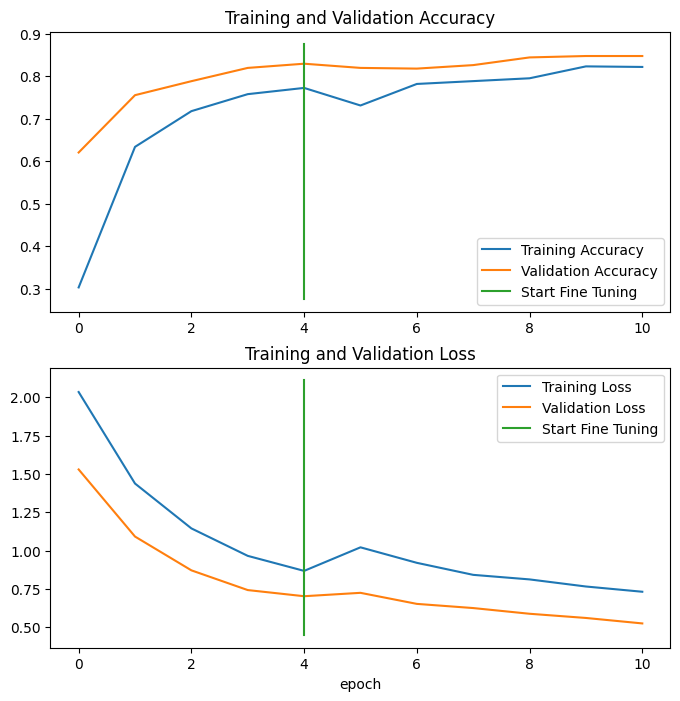

In [ ]:
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_10_percent_data_aug,
                 initial_epochs=5)

### **Model 4: Fine-tuning an existing model all of the data**

In [ ]:
dataset_path = Path("/content/drive/MyDrive/Dataset/10_food_classes")

train_path = dataset_path / "train"
test_path = dataset_path / "test"

In [ ]:
IMG_SIZE = (224, 224)
train_data_10_classes_full = tf.keras.preprocessing.image_dataset_from_directory(train_path,
                                                                                 label_mode="categorical",
                                                                                 image_size=IMG_SIZE)

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_path,
                                                                label_mode="categorical",
                                                                image_size=IMG_SIZE)

Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [ ]:
print("Evaluating model performance before loading weights:")
initial_evaluation = model_2.evaluate(test_data)

model_2 = create_base_model(learning_rate=0.0001) # 10x lower learning rate for fine-tuning
model_2.load_weights(checkpoint_path)
print(f"\nModel weights successfully loaded from: {checkpoint_path}\n")

# After loading the weights, this should have gone down (no fine-tuning)
print("Evaluating model performance after loading weights (expected improvement without fine-tuning):")
post_evaluation = model_2.evaluate(test_data)

print(f"\nInitial Evaluation Loss/Accuracy: {initial_evaluation}")
print(f"Post-Weights Evaluation Loss/Accuracy: {post_evaluation}")

Evaluating model performance before loading weights:
79/79 ━━━━━━━━━━━━━━━━━━━━ 342s 4s/step - accuracy: 0.8442 - loss: 0.5163


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



Model weights successfully loaded from: ten_percent_model_checkpoints_weights/checkpoint.weights.h5

Evaluating model performance after loading weights (expected improvement without fine-tuning):
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - accuracy: 0.8338 - loss: 0.6684

Initial Evaluation Loss/Accuracy: [0.5303918123245239, 0.8443999886512756]
Post-Weights Evaluation Loss/Accuracy: [0.6890558004379272, 0.8295999765396118]


In [ ]:
model_2.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ data_augmentation (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling_layer         │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 10)                  │          12,810 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
print(f"Trainable Layers in the Model:{model_2.name}\n" + "-"*35)

for layer_number, layer in enumerate(model_2.layers):
  print(f"Layer {layer_number}: {layer.name} (Trainable: {layer.trainable})")

print(f"Total number of trainable variables in the model: {len(model_2.trainable_variables)}")

Trainable Layers in the Model:functional_6
-----------------------------------
Layer 0: input_layer (Trainable: True)
Layer 1: data_augmentation (Trainable: True)
Layer 2: efficientnetv2-b0 (Trainable: False)
Layer 3: global_average_pooling_layer (Trainable: True)
Layer 4: output_layer (Trainable: True)
Total number of trainable variables in the model: 2


In [ ]:
# Unfreeze the top 10 layers in model_2's base_model
model_2_base_model = model_2.layers[2]
model_2_base_model.trainable = True

# Freeze all layers except for the last 10
for layer in model_2_base_model.layers[:-10]:
  layer.trainable = False

In [ ]:
print(f"Trainable Layers in the Model:{model_2_base_model.name}\n" + "-"*35)

for layer_number, layer in enumerate(model_2_base_model.layers):
  print(f"Layer {layer_number}: {layer.name} (Trainable: {layer.trainable})")

Trainable Layers in the Model:efficientnetv2-b0
-----------------------------------
Layer 0: input_layer_7 (Trainable: False)
Layer 1: rescaling_5 (Trainable: False)
Layer 2: normalization_5 (Trainable: False)
Layer 3: stem_conv (Trainable: False)
Layer 4: stem_bn (Trainable: False)
Layer 5: stem_activation (Trainable: False)
Layer 6: block1a_project_conv (Trainable: False)
Layer 7: block1a_project_bn (Trainable: False)
Layer 8: block1a_project_activation (Trainable: False)
Layer 9: block2a_expand_conv (Trainable: False)
Layer 10: block2a_expand_bn (Trainable: False)
Layer 11: block2a_expand_activation (Trainable: False)
Layer 12: block2a_project_conv (Trainable: False)
Layer 13: block2a_project_bn (Trainable: False)
Layer 14: block2b_expand_conv (Trainable: False)
Layer 15: block2b_expand_bn (Trainable: False)
Layer 16: block2b_expand_activation (Trainable: False)
Layer 17: block2b_project_conv (Trainable: False)
Layer 18: block2b_project_bn (Trainable: False)
Layer 19: block2b_drop (

In [ ]:
model_2.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # lr is 10x lower than before for fine-tuning
                metrics=["accuracy"])

In [ ]:
fine_tune_epochs = initial_epochs + 5

history_fine_10_classes_full = model_2.fit(train_data_10_classes_full,
                                           epochs=fine_tune_epochs,
                                           initial_epoch=history_10_percent_data_aug.epoch[-1],
                                           validation_data=test_data,
                                           validation_steps=int(0.25 * len(test_data)),
                                           callbacks=[create_tensorboard_callback("transfer_learning", "full_10_classes_fine_tune_last_10")])

Saving TensorBoard log files to: transfer_learning/full_10_classes_fine_tune_last_10/20250205-045902
Epoch 5/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1807s 8s/step - accuracy: 0.7218 - loss: 1.0454 - val_accuracy: 0.8717 - val_loss: 0.4064
Epoch 6/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 153ms/step - accuracy: 0.7835 - loss: 0.7562 - val_accuracy: 0.9013 - val_loss: 0.3151
Epoch 7/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 42s 177ms/step - accuracy: 0.8084 - loss: 0.6602 - val_accuracy: 0.9112 - val_loss: 0.2679
Epoch 8/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 74s 144ms/step - accuracy: 0.8190 - loss: 0.5945 - val_accuracy: 0.9062 - val_loss: 0.2728
Epoch 9/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 41s 174ms/step - accuracy: 0.8264 - loss: 0.5602 - val_accuracy: 0.9145 - val_loss: 0.2543
Epoch 10/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - accuracy: 0.8363 - loss: 0.5296 - val_accuracy: 0.9227 - val_loss: 0.2442


In [ ]:
print("====================================================")
print("Model Evaluation - Data Augmented (Full Training Data)")
print(f"Model Name: {model_2.name}")
print(f"Test Dataset: {len(test_data)*BATCH_SIZE} samples")
print("====================================================")

print("🔄 Evaluating model performance on test data...")
results_fine_tune_full_data = model_2.evaluate(test_data)

print("\n✅ Evaluation Complete!")
print("\n📝 Results:\n")
print(f"Test Loss: {results_fine_tune_full_data[0]:.4f}")
print(f"Test Accuracy: {results_fine_tune_full_data[1]*100:.2f}%")
print("----------------------------------------------------")

Model Evaluation - Data Augmented (Full Training Data)
Model Name: functional_6
Test Dataset: 2528 samples
🔄 Evaluating model performance on test data...
79/79 ━━━━━━━━━━━━━━━━━━━━ 11s 134ms/step - accuracy: 0.9196 - loss: 0.2545

✅ Evaluation Complete!

📝 Results:

Test Loss: 0.2767
Test Accuracy: 91.36%
----------------------------------------------------


In [ ]:
print("====================================================")
print("Model Evaluation - Data Augmented (10% Training Data)")
print(f"Model Name: {model_2.name}")
print(f"Test Dataset: {len(test_data)*BATCH_SIZE} samples")
print("====================================================")

print("🔄 Evaluating model performance on test data...")
results_fine_tune_10_percent = model_2.evaluate(test_data)

print("\n✅ Evaluation Complete!")
print("\n📝 Results:\n")
print(f"Test Loss: {results_fine_tune_10_percent[0]:.4f}")
print(f"Test Accuracy: {results_fine_tune_10_percent[1]*100:.2f}%")
print("----------------------------------------------------")

Model Evaluation - Data Augmented (10% Training Data)
Model Name: functional_6
Test Dataset: 2528 samples
🔄 Evaluating model performance on test data...
79/79 ━━━━━━━━━━━━━━━━━━━━ 10s 122ms/step - accuracy: 0.9215 - loss: 0.2504

✅ Evaluation Complete!

📝 Results:

Test Loss: 0.2767
Test Accuracy: 91.36%
----------------------------------------------------


5
11
[0.30266666412353516, 0.6333333253860474, 0.7173333168029785, 0.7573333382606506, 0.7720000147819519, 0.7449333071708679, 0.7846666574478149, 0.8030666708946228, 0.8161333203315735, 0.8282666802406311, 0.8303999900817871]


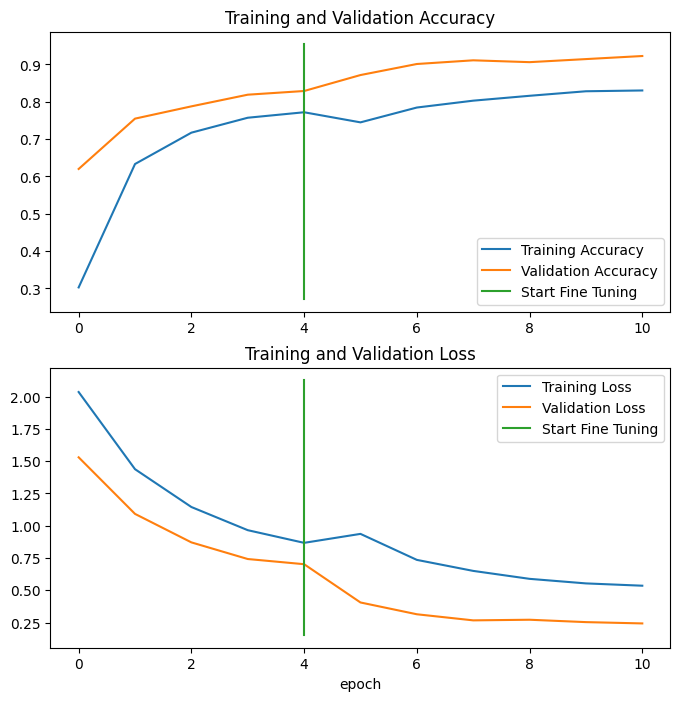

In [ ]:
compare_historys(original_history=history_10_percent_data_aug,
                 new_history=history_fine_10_classes_full,
                 initial_epochs=5)

In [1]:
import zipfile

with zipfile.ZipFile('/content/transfer_learning.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/transfer_learning')

In [2]:
%load_ext tensorboard
%tensorboard --logdir /content/transfer_learning

Output hidden; open in https://colab.research.google.com to view.